In [1]:
import pandas as pd
import os
import re
import seaborn as sns
from matplotlib import pyplot as plt
import sys
import folium
from sklearn.preprocessing import MinMaxScaler

In [2]:
tri = pd.read_csv("../data/clean/tri.csv")

/var/folders/37/fsk42jds3255qblrs5r1v99c0000gn/T/ipykernel_5110/641896581.py:1: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  tri = pd.read_csv("../data/clean/tri.csv")


In [3]:
tri.shape

(1972311, 16)

In [6]:
aqi = pd.read_csv("../data/clean/aqi.csv")

/var/folders/37/fsk42jds3255qblrs5r1v99c0000gn/T/ipykernel_5110/1619322484.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  aqi = pd.read_csv("../data/clean/aqi.csv")


In [7]:
aqi.shape

(1915530, 13)

In [54]:
tri.head()

,year,facility_name,city,county,state,zip,latitude,longitude,federal_facility,industry_sector,chemical,clean_air_act_chemical,carcinogen,on_site_release_total,one_time_release,production_ratio
0,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Xylene (mixed isomers),YES,NO,187.0,0.0,1.17
1,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Ethylbenzene,YES,YES,30.0,0.0,1.17
2,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Toluene,YES,NO,664.0,0.0,1.07
3,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Dichloromethane,YES,YES,412.0,0.0,1.00
4,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Copper compounds,NO,NO,0.0,0.0,0.42


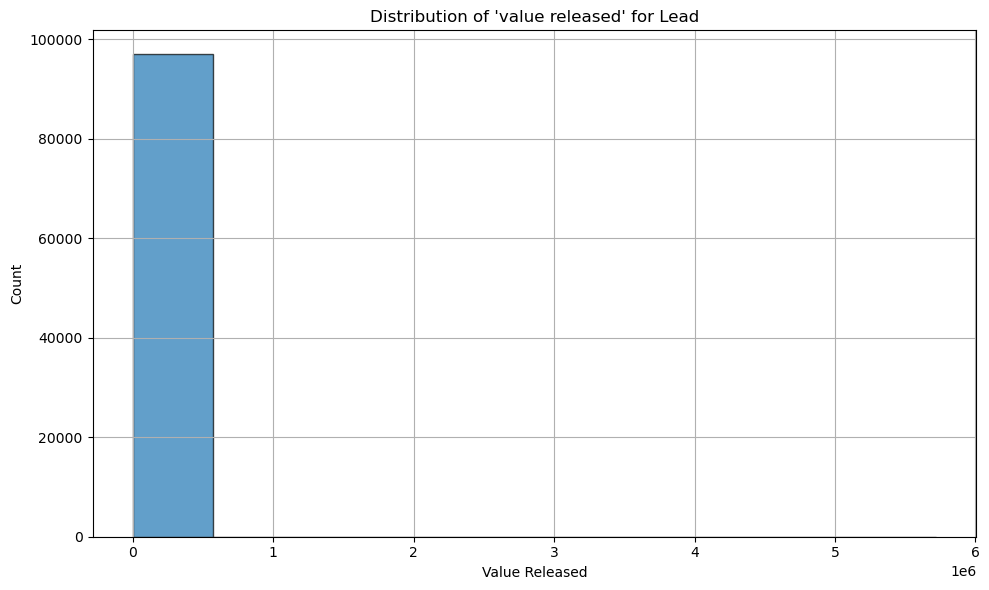

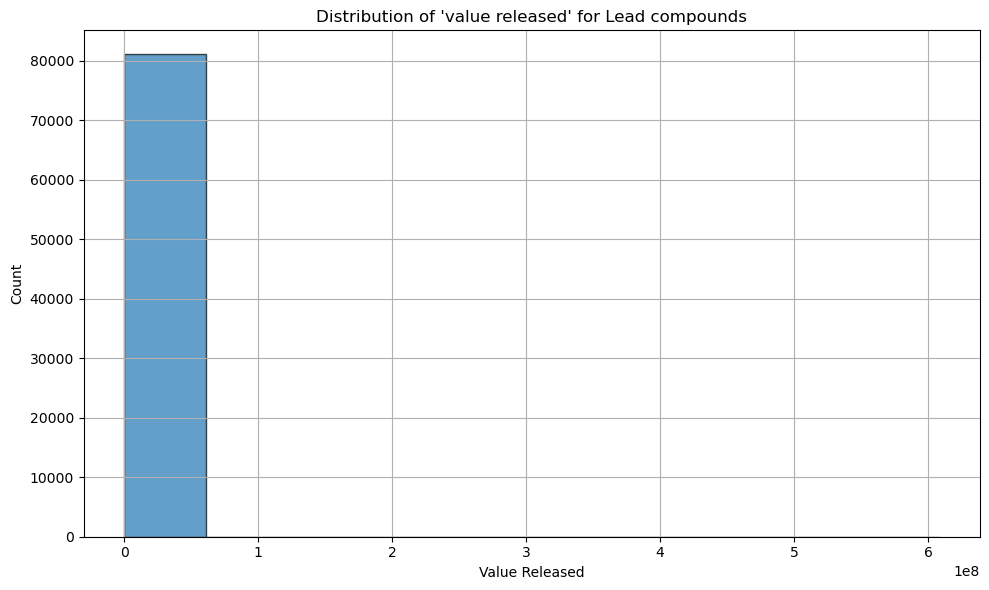

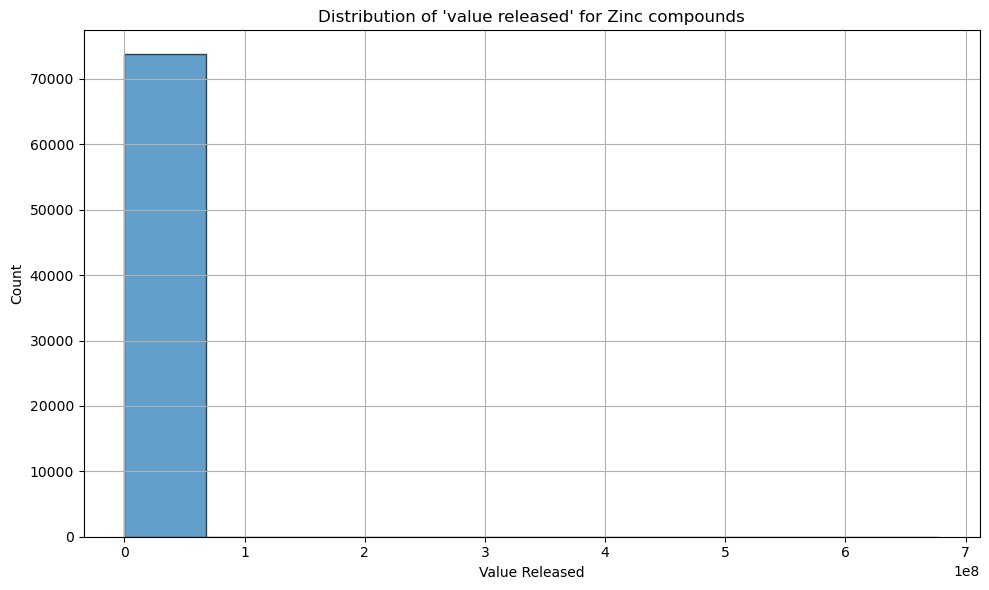

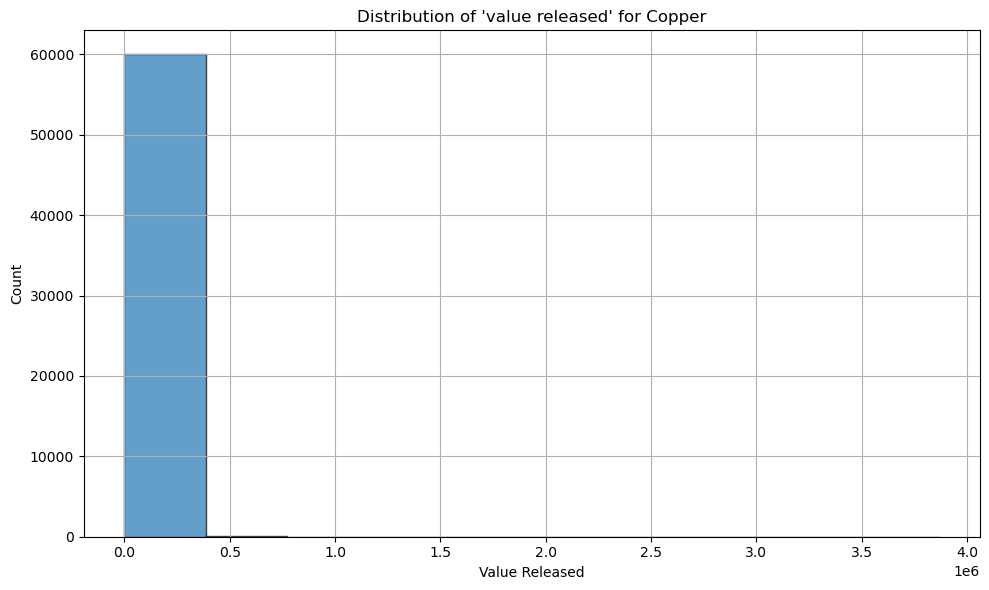

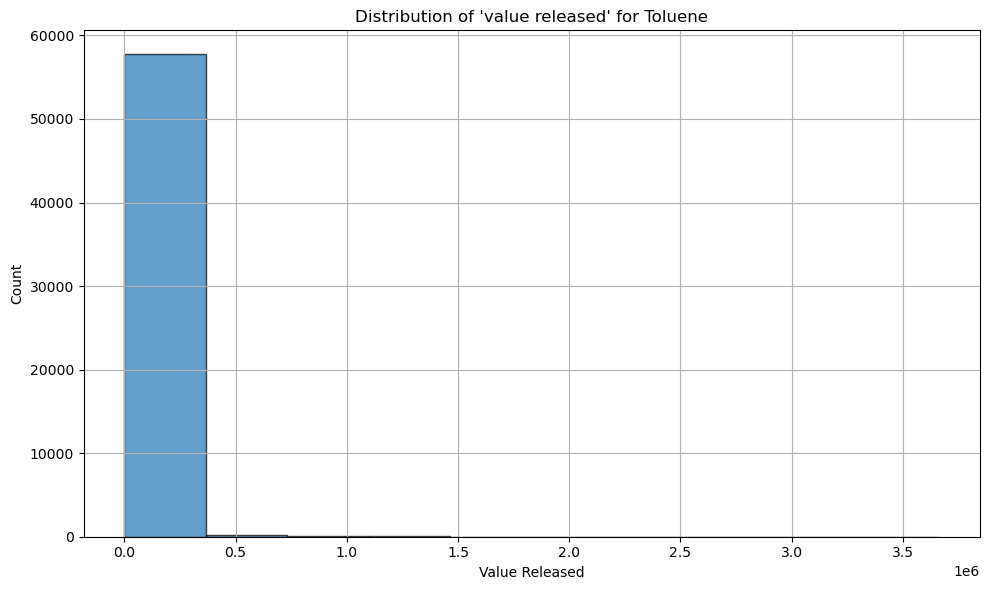

In [55]:

top_5_chemicals = tri['chemical'].value_counts().head(5).index.tolist()

# Loop through each of the top 5 chemicals
for chemical in top_5_chemicals:
    subset = tri[tri['chemical'] == chemical]

    # Assuming 'value released' is continuous, we'll use a histogram; if it's categorical, consider a bar plot
    plt.figure(figsize=(10,6))
    plt.hist(subset['on_site_release_total'], edgecolor='k', alpha=0.7)
    plt.title(f"Distribution of 'value released' for {chemical}")
    plt.xlabel('Value Released')
    # plt.xlim(0,300)
    plt.ylabel('Count')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [16]:
top_5_chemicals = tri['chemical'].value_counts().head(5).index.tolist()

In [17]:
top_5_chemicals

['Lead', 'Lead compounds', 'Zinc compounds', 'Copper', 'Toluene']

In [51]:
top_5_chemicals[0]

'Lead'

In [56]:
grouped = tri.groupby(['year', 'latitude', 'longitude']).agg({'on_site_release_total': 'sum'}).reset_index()

heat_data = []
years = sorted(grouped['year'].unique())

for year in years:
    yearly_data = grouped[grouped['year'] == year]
    heat_data.append([[row['latitude'], row['longitude'], row['on_site_release_total']] for _, row in yearly_data.iterrows()])

import folium
from folium.plugins import HeatMapWithTime

m = folium.Map(location=[tri['latitude'].mean(), tri['longitude'].mean()], zoom_start=5)

HeatMapWithTime(heat_data, index=years, auto_play=True, max_opacity=0.6, radius=25).add_to(m)

m


In [40]:
tri["year"] = pd.to_datetime(tri["year"])

In [38]:
tri.year.max()

'1970-01-01 00:00:00.000002022'

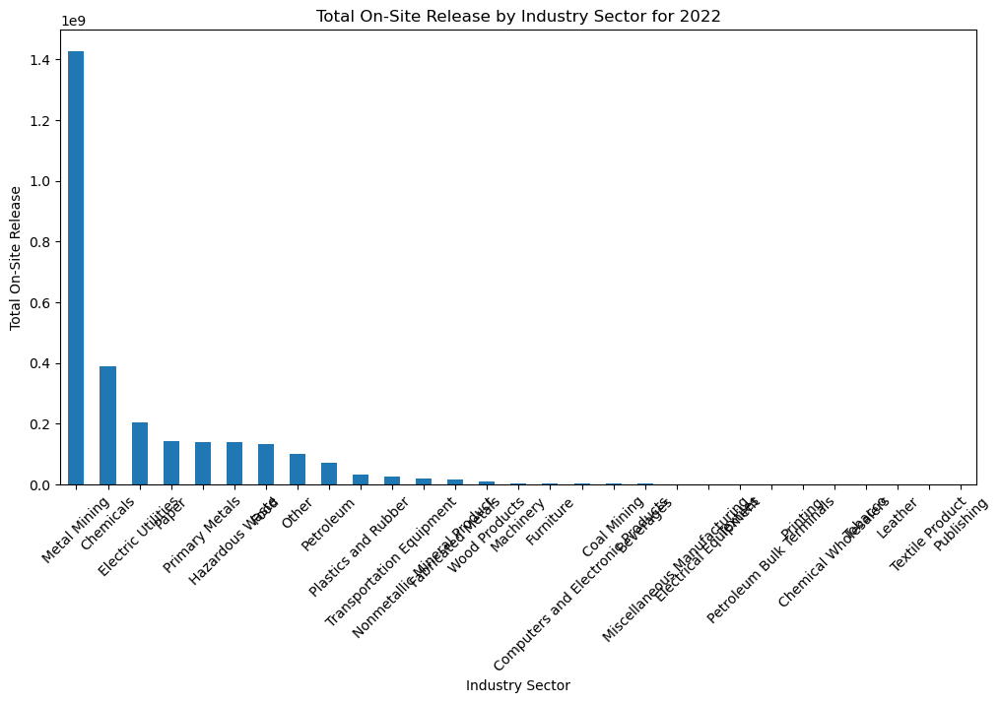

In [46]:
# Convert datetime to integer timestamp (in nanoseconds since 1970)
tri['timestamp_ns'] = tri['year'].values.astype(int)

# Extract the year from the nanosecond timestamp
tri['extracted_year'] = (tri['timestamp_ns'] % 10**9)  # Extract the last 9 digits, which represent the nanoseconds

# Filter the dataframe for the year 2022
tri_2022 = tri[tri['extracted_year'] == 2022]

# Group by industry_sector and sum the on_site_release_total, then sort
industry_stats_2022 = tri_2022.groupby('industry_sector')['on_site_release_total'].sum().sort_values(ascending=False)

# Plot
plt.figure(figsize=(12, 6))
industry_stats_2022.plot(kind='bar')
plt.title('Total On-Site Release by Industry Sector for 2022')
plt.ylabel('Total On-Site Release')
plt.xlabel('Industry Sector')
plt.xticks(rotation=45)
plt.show()


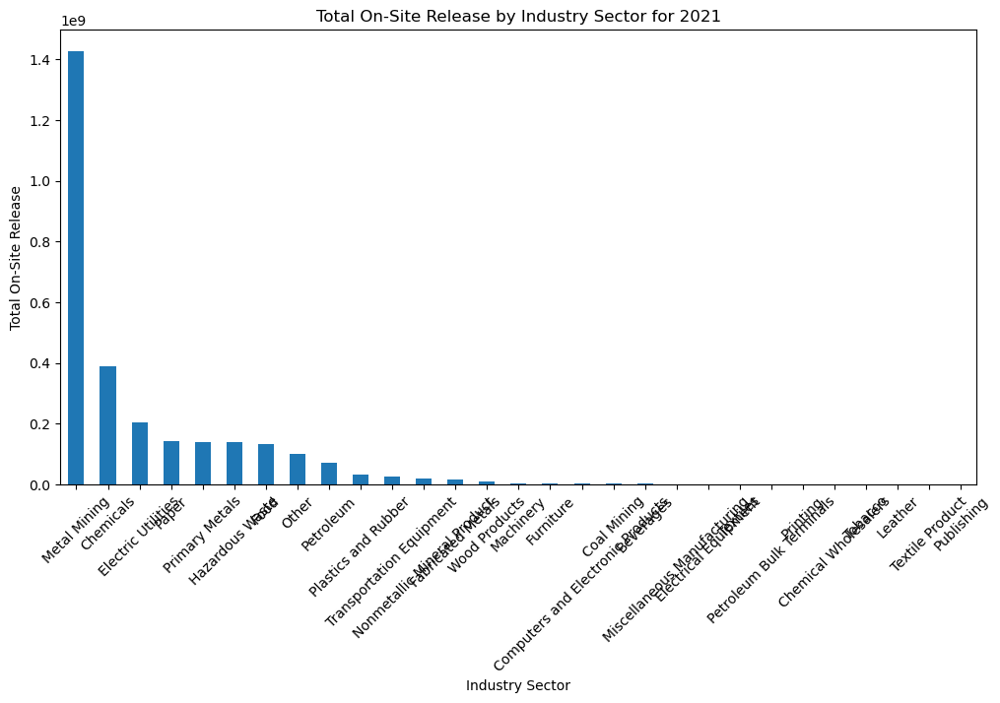

In [47]:
# Filter the dataframe for the year 2022
tri_2021 = tri[tri['extracted_year'] == 2021]

# Group by industry_sector and sum the on_site_release_total, then sort
industry_stats_2021 = tri_2021.groupby('industry_sector')['on_site_release_total'].sum().sort_values(ascending=False)

# Plot
plt.figure(figsize=(12, 6))
industry_stats_2022.plot(kind='bar')
plt.title('Total On-Site Release by Industry Sector for 2021')
plt.ylabel('Total On-Site Release')
plt.xlabel('Industry Sector')
plt.xticks(rotation=45)
plt.show()


In [27]:
# Extract the year from the datetime format
tri['year_int'] = tri['year'].dt.year

# Filter for 2010 and 2022
years_of_interest = [2010, 2022]
filtered_df = tri[tri['year_int'].isin(years_of_interest)]

# Group by county and sum the emissions for each year
grouped_df = filtered_df.groupby(['year_int', 'county']).agg({'on_site_release_total': 'sum'}).unstack(level=0)

# Calculate the difference and percent increase
grouped_df['difference'] = grouped_df['on_site_release_total', 2022] - grouped_df['on_site_release_total', 2010]
grouped_df['percent_increase'] = (grouped_df['difference'] / grouped_df['on_site_release_total', 2010]) * 100

# Sort by the highest percent increase
sorted_df = grouped_df.sort_values(by='percent_increase', ascending=False)

# Display the top counties by percent increase
top_counties = sorted_df[['difference', 'percent_increase']]

KeyError: ('on_site_release_total', 2022)

In [22]:
tri.head()

,year,facility_name,city,county,state,zip,latitude,longitude,federal_facility,industry_sector,chemical,clean_air_act_chemical,carcinogen,on_site_release_total,one_time_release,production_ratio
0,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Xylene (mixed isomers),YES,NO,187.0,0.0,1.17
1,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Ethylbenzene,YES,YES,30.0,0.0,1.17
2,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Toluene,YES,NO,664.0,0.0,1.07
3,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Dichloromethane,YES,YES,412.0,0.0,1.00
4,1970-01-01 00:00:00.000002,CHICAGO AEROSOL LLC,BRIDGEVIEW,COOK,IL,60455,41.739,-87.8106,NO,Hazardous Waste,Copper compounds,NO,NO,0.0,0.0,0.42


In [36]:
basic_stats = tri['on_site_release_total'].describe()
basic_stats

count    1.972311e+06
mean     4.218038e+04
std      1.906405e+06
min      0.000000e+00
25%      0.000000e+00
50%      2.500000e+01
75%      1.468000e+03
max      6.780574e+08
Name: on_site_release_total, dtype: float64

In [ ]:
plt.figure(figsize=(12, 6))
sns.histplot(tri['on_site_release_total'], kde=True)
plt.title('Distribution of On-Site Release Totals')
plt.xlabel('On-Site Release Total')
plt.ylabel('Frequency')
plt.show()

In [ ]:
federal_stats = tri.groupby('federal_facility')['on_site_release_total'].sum()

plt.figure(figsize=(8, 6))
federal_stats.plot(kind='bar')
plt.title('Total On-Site Release: Federal vs. Non-Federal Facilities')
plt.ylabel('Total On-Site Release')
plt.xlabel('Facility Type')
plt.xticks(ticks=[0, 1], labels=['Non-Federal', 'Federal'], rotation=0)
plt.show()


In [ ]:
combined_stats = tri.groupby(['industry_sector', 'federal_facility'])['on_site_release_total'].sum().unstack()

combined_stats.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Total On-Site Release by Industry Sector (Federal vs. Non-Federal)')
plt.ylabel('Total On-Site Release')
plt.xlabel('Industry Sector')
plt.xticks(rotation=45)
plt.legend(title='Federal Facility', labels=['Non-Federal', 'Federal'])
plt.show()


In [48]:
# top polluting industries
top_industries = tri.groupby('industry_sector')['on_site_release_total'].mean().nlargest(5)
top_industries

industry_sector
Metal Mining          2.383638e+06
Electric Utilities    1.106782e+05
Paper                 6.413902e+04
Coal Mining           6.004059e+04
Hazardous Waste       5.583020e+04
Name: on_site_release_total, dtype: float64

In [49]:
# federal companies
federal_comparison = tri.groupby('federal_facility')['on_site_release_total'].sum()
federal_comparison

federal_facility
NO     8.170081e+10
YES    1.492016e+09
Name: on_site_release_total, dtype: float64

In [50]:
industry_federal_pivot = tri.pivot_table(values='on_site_release_total', index='industry_sector', columns='federal_facility', aggfunc='sum')
industry_federal_pivot

federal_facility,NO,YES
industry_sector,,
Apparel,7.642449e+05,NaN
Beverages,7.761454e+07,NaN
Chemical Wholesalers,2.590839e+07,NaN
Chemicals,1.057091e+10,1.487194e+06
Coal Mining,2.606962e+08,NaN
Computers and Electronic Products,1.030569e+08,NaN
Electric Utilities,1.317921e+10,8.333237e+08
Electrical Equipment,8.302034e+07,NaN
Fabricated Metals,6.405874e+08,5.452743e+06
